<a href="https://colab.research.google.com/github/alaguilarunal/Multilayer_perceptron_for_data_imputation/blob/main/Proyecto_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<center>
<h1 style="font-style: italic;">
<b>Imputación de datos en series de tiempo con perceptrón multicapa y optimización de parámetros con modelos sustitutos</b>
</h1>
<h5 style="font-style: italic;">
Alejandro Enrique Aguilar Sánchez
</h5>

</center>

#Introducción

La instrumentación geotécnica representa actualmente un componente clave en la supervisión de grandes obras civiles, ya que permite observar el comportamiento estructural a lo largo del tiempo y monitorear variables críticas para la seguridad y el rendimiento de la infraestructura. A partir de estos datos, es posible aplicar metodologías de aprendizaje automático (ML) para desarrollar modelos predictivos que apoyen la toma de decisiones técnicas.

Sin embargo, una de las principales limitaciones en el uso de estos datos es la frecuente aparición de vacíos en las series temporales, provocados por fallas en los sensores, errores en los dataloggers, pérdidas de memoria o inestabilidad en las redes de transmisión. Esta pérdida de información puede comprometer significativamente la eficacia de los modelos predictivos.

El presente trabajo propone el desarrollo y evaluación de una metodología basada en redes neuronales para la imputación (completitud) de datos faltantes en un Extensómetro de Posición Múltiple (EPM), el cual ha estado inactivo por más de un año. Para ello, se utilizará como referencia un conjunto de datos provenientes de una técnica complementaria de monitoreo geotécnico llamada TPM (Tunnel Profile Monitoring), que incluye información de 14 sensores (7 de deformación y 7 de inclinación). Esta estrategia busca aprovechar la correlación espacial y temporal entre ambos sistemas de instrumentación para restaurar datos perdidos de manera robusta, favoreciendo así la continuidad de los modelos de análisis y predicción estructural.

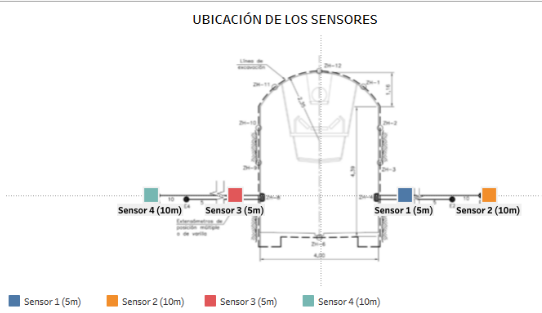

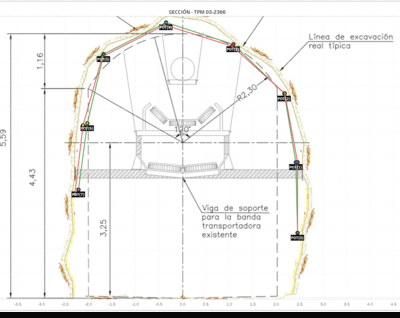

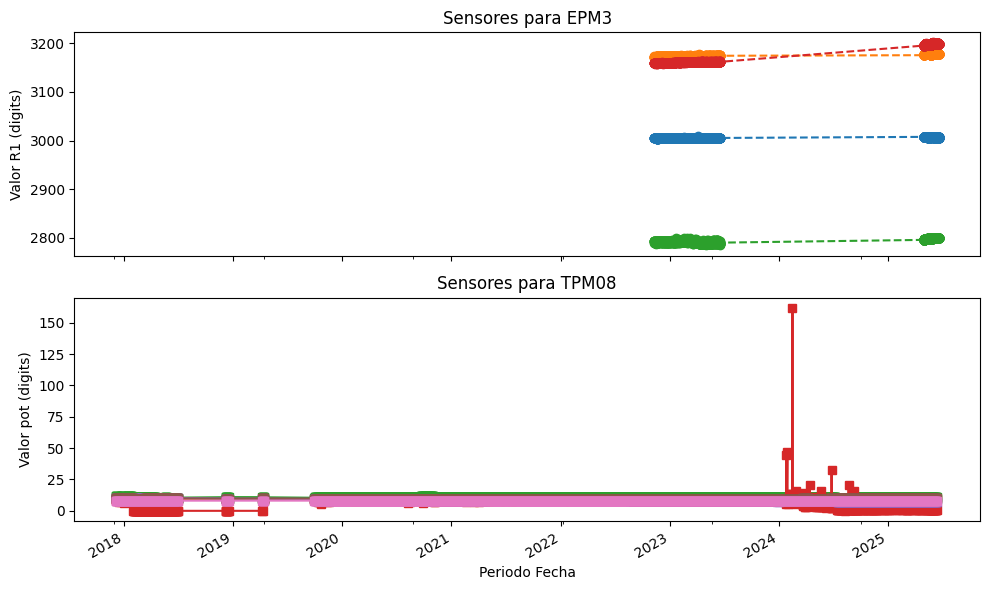

#**Artículo de referencia:** Long-term missing value imputation for time series data using deep neural networks

# Resumen

En este artículo se presenta un método para imputar valores faltantes en series de tiempo multivariadas, con especial atención a brechas largas y continuas de datos —muy comunes en estudios ambientales— donde la ausencia de registros puede comprometer tanto el análisis de tendencias como la alimentación de modelos numéricos.

**Variable objetivo y variables auxiliares**  
Se asume que la primera columna de la matriz de observaciones corresponde a la *variable objetivo* Y, cuyos valores ausentes deben imputarse, y que las columnas restantes son *variables auxiliares* que disponen de datos completos y sirven de soporte.

**Perceptrón Multicapa (MLP)**  
Se emplea un MLP para capturar relaciones no lineales complejas entre la variable objetivo y las auxiliares.

**Optimización de Hiperparámetros (HPO) automatizada**  
Se utilizan modelos sustitutos (funciones de base radial y procesos gaussianos) para explorar el espacio de configuraciones del MLP (capas, nodos, “lag”, etc.) y seleccionar la arquitectura que minimiza el error de predicción.

**Imputación secuencial**  
Tras ajustar la arquitectura óptima, los valores faltantes se imputan de manera progresiva, de modo que cada predicción alimenta la siguiente.

---

**Validación**  
Se realizaron experimentos numéricos en tres conjuntos de datos ambientales:  
1. Niveles diarios de agua subterránea (auxiliares: temperatura, precipitación y caudal de ríos).  
2. Humedad del suelo simulada diariamente.  
3. Datos horarios de intercambio neto de ecosistemas (FLUXNET).  

La comparación con ImputeTS y mtsdi mostró que el MLP supera a estas técnicas, especialmente en series con comportamientos no lineales.


#Sobre el dataset

El dataset es necesario generarlo a partir de la información de la instrumentación debido a que no tiene la estructura necesaria para un modelo de ML. Se utilizan tres fuentes de datos diferentes:

Monitoreo TPM (por sensor)
1.   Fecha, sensor, deformación (mm)
2.   Fecha, sensor, Seno del ángulo


Monitoreo EPM (por sensor)
1.   Fecha, sensor, Deformación (mm/m)

**Cantidad de registros iniciales**

$$
\begin{array}{|l|l|l|}
\hline
\textbf{Sensor por TPM} & \textbf{# Registros de deformación} & \textbf{# Registros de inclinación} \\
\hline
\text{Sensor 1} & 936 & 936 \\
\hline
\text{Sensor 2} & 936 & 936\\
\hline
\text{Sensor 3} & 936 & 936\\
\hline
\text{Sensor 5} & 936 & 936\\
\hline
\text{Sensor 6} & 936 & 936\\
\hline
\text{Sensor 7} & 936 & 936\\
\hline
\end{array}
$$

$$
\begin{array}{|l|l|}
\hline
\textbf{Sensor por EPM} & \textbf{# Registros de deformación} \\
\hline
\text{Sensor 1} & 3161 \\
\hline
\text{Sensor 2} & 3161\\
\hline
\text{Sensor 3} & 3161\\
\hline
\text{Sensor 4} & 3161\\
\hline
\end{array}
$$


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import CubicSpline
import seaborn as sns
import plotly.express as px
from google.colab import drive
drive.mount('/content/drive')

root = '/content/drive/MyDrive/Seminario I/3. Datos de insturmentación'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
pip install scikit-optimize

In [ ]:
pip install tensorflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 644.9/644.9 MB 596.6 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.5/57.5 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.5/24.5 MB 84.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 319.9/319.9 kB 17.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 116.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 108.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 115.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 16.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.5/72.5 kB 4.5 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 6.31.1
    Uninstalling protobuf-6.31.1:
      Successfully uninstalled protobuf-6.31.1


##Formateo inicial de los conjuntos de datos

Se deben hacer correcciones en el formato de fecha y en la variables numéricas

In [ ]:
meses_es_a_en = {
    'ene': 'jan', 'feb': 'feb', 'mar': 'mar', 'abr': 'apr',
    'may': 'may', 'jun': 'jun', 'jul': 'jul', 'ago': 'aug',
    'sep': 'sep', 'oct': 'oct', 'nov': 'nov', 'dic': 'dec'
}

conv_tpm8 = pd.read_csv(f"{root}/2. TPM's/datos/Convergencia TPM08.csv",delimiter=';',header=0)
conv_tpm8.rename(columns={"Periodo Fecha":"date","Variable":"def"},inplace=True)
conv_tpm8.drop(columns=["Nombres de medidas","ub estacion"],inplace=True)
conv_tpm8["def"] = pd.to_numeric(conv_tpm8["def"].str.replace(',','.'),errors="coerce")
for es,eng in meses_es_a_en.items():
  conv_tpm8["date"] = conv_tpm8["date"].str.replace(es,eng, case=False)
conv_tpm8["date"] = pd.to_datetime(conv_tpm8["date"], format="mixed", dayfirst=True)
sin_theta_tpm08 = pd.read_csv(f"{root}/2. TPM's/datos/Angulo TPM08.csv",delimiter=';',header=0)
tilt = pd.read_csv(f"{root}/2. TPM's/datos/tilt TPM08.csv",delimiter=',',header=0)
tilt = tilt.rename(columns={"Mín. TILT DINAMICO":"tilt","Periodo Fecha":"date"})

tilt["date"] = tilt["date"].astype(str)
for es,eng in meses_es_a_en.items():
  tilt["date"] = tilt["date"].str.replace(es,eng, case=False)
tilt["date"] = pd.to_datetime(tilt["date"], format="mixed", dayfirst=True)

sin_theta_tpm08.rename(columns={
    "Angulo_Tilt (acumulado)":"sin_theta",
    "Periodo Fecha":"date"
})

EPM3 = pd.read_csv(f"{root}/1. EPM's/EPM3.csv",delimiter=';')
EPM3.rename(columns={"alias":"sensor"},inplace=True)
EPM3.drop(columns=["prefix"],inplace=True)
EPM3["date"] = pd.to_datetime(EPM3["date"], format="mixed", dayfirst=True)
EPM3["R1"] = pd.to_numeric(EPM3["R1"].str.replace(',','.'),errors="coerce")
EPM3 = EPM3.sort_index(ascending=False)
EPM3["Frequency"] = EPM3["date"].diff().dt.total_seconds() / 3600

#-----DF inicial TPM08
tpm_dataset = conv_tpm8.merge(
    tilt,
    on=["date","pot"],
    how="left"
)
mask = tpm_dataset['date'].between(EPM3["date"].min(),EPM3["date"].max())
tpm_dataset = tpm_dataset.loc[mask]
tpm_dataset["Frequency"] = tpm_dataset["date"].diff().dt.days
conv_tpm8

,def,date,pot
0,9.341819,2017-12-04,POT(7)
1,9.349171,2017-12-05,POT(7)
2,9.356015,2017-12-06,POT(7)
3,9.341234,2017-12-07,POT(7)
4,9.332140,2017-12-08,POT(7)
...,...,...,...
16075,7.882116,2025-06-09,POT(1)
16076,7.882096,2025-06-10,POT(1)
16077,7.882093,2025-06-11,POT(1)
16078,7.882053,2025-06-12,POT(1)


In [ ]:
tilt

,date,pot,tilt
0,2017-12-04,POT(7),0.245154
1,2017-12-05,POT(7),0.000000
2,2017-12-06,POT(7),0.000000
3,2017-12-07,POT(7),0.000000
4,2017-12-08,POT(7),0.000000
...,...,...,...
20064,2025-10-06,POT(1),-0.002727
20065,2025-10-07,POT(1),-0.002731
20066,2025-10-08,POT(1),-0.002727
20067,2025-10-09,POT(1),-0.002730


In [ ]:
EPM3

,R1,sensor,date,Frequency
12659,3158.688700,Sensor 1 (5m),2022-11-09 19:00:00,NaN
12658,3158.688700,Sensor 1 (5m),2022-11-10 01:00:00,6.0
12657,3158.688700,Sensor 1 (5m),2022-11-10 07:00:00,6.0
12656,3159.506200,Sensor 1 (5m),2022-11-10 13:00:00,6.0
12655,3159.115200,Sensor 1 (5m),2022-11-10 19:00:00,6.0
...,...,...,...,...
4,3006.180340,Sensor 4 (10m),2025-06-19 19:00:00,0.5
3,3006.371064,Sensor 4 (10m),2025-06-19 19:30:00,0.5
2,3006.215016,Sensor 4 (10m),2025-06-19 20:00:00,0.5
1,3006.267032,Sensor 4 (10m),2025-06-19 20:30:00,0.5


##Uso de spline para aumento de puntos

El problema que se tiene en estos registros es la diferencia entre frecuencias de muestreo utlizadas para cada metodología de monitoreo. Para los sensores de deformación e inclinación usados en el monitoreo **TPM**, desde su instalación, la frecuencia de muestreo fue de ***12h***, para los sensores del monitoreo ***EPM***, desde su instalación y hasta la fecha de corte donde inicia la perdida de información, el muestreo se hace cada ***6 horas***, y despues del `2025-05-01 00:00:00` luego de la instalación del nuevo proveedor del servicio, para el monitoreo EPM se configura y toman datos cada 30 minutos.

Una propuesta para atacar el problema de las frecuencias de muestreo, y a su vez data augmentation, es usar una metodología que permita rellenar datos entre puntos, y de esta forma, a partir de datos sinteticos, mantener la morfología de la serie, pero con la cnatidad de datos indicada.

Para lograr esto se propone el uso de la metodología ***Spline***

La interpolación mediante splines consiste en construir una función suave por tramos que aproxime o interpole los datos observados de una serie de tiempo, y luego evaluarla en instantes intermedios para aumentar la densidad de muestreo.

$$
S(t) =
\begin{cases}
P_1(t), & t \in [t_0, t_1],\\
P_2(t), & t \in [t_1, t_2],\\
\vdots & \\
P_N(t), & t \in [t_{N-1}, t_N],
\end{cases}
$$

Este spline debe además cumplir condiciones de suavidad en cada nodo:

$$
S^{(m)}(t_i^-) \;=\; S^{(m)}(t_i^+)
\quad\text{para } m=0,1,\dots,k-1,\;i=1,\dots,N-1.
$$

El caso más habitual es el _spline cúbico_ (grado 3), que garantiza continuidad de la función y de sus dos primeras derivadas.

Para el aumento del muestreo en la series de tiempo se siguen los siguientes pasos para aplicar la técnica de spline y generar muestras cada 30 minutos para los sensores de ambos monitoreos:

1. **Configurar la resolución**  
   Definir el intervalo de interpolación (por ejemplo, cada 30 minutos).

2. **Iterar por cada sensor**  
   Para cada identificador de sensor, aislar sus observaciones.

3. **Segmentar según frecuencia estable**  
   Dividir la serie en tramos donde la frecuencia de muestreo no cambie.

4. **Interpolar cada tramo**  
   - Construir un eje temporal continuo para el tramo (en días o índices).  
   - Ajustar un spline cúbico natural a las variables `def` y `tilt`.  
   - Muestrear el spline a la resolución deseada y generar las fechas correspondientes.

5. **Reunir los fragmentos**  
   Concatenar todas las porciones splineadas de ese sensor en un único DataFrame.

6. **Acumular resultados globales**  
   Repetir el proceso para todos los sensores y combinar todo en un DataFrame maestro.

7. **(Opcional) Visualizar**  
   Graficar la serie interpolada junto a los datos originales para cada sensor.


###Monitoreo TPM

In [ ]:
step = 0.5 / 24

TPM8_spline=pd.DataFrame()

for pot in tpm_dataset["pot"].unique():
  #1. Obtengo la primera fecha y solo los registro cuya distancia temporal con el registro anterior es 1 dia
  t = tpm_dataset.loc[:,:]

  #2. La columna Periodo fecha la paso a formato DateTime
  t.loc[:,'date'] = pd.to_datetime(t['date'])

  #4. Filtro del data frame el pot asociado
  t = t.loc[t["pot"]==pot]
  #t["part_id"]= (t['Frequency'] != t['Frequency'].shift()).cumsum()

  group_id = 0
  c_row = 0
  group_serie = []
  i=0
  for i,row in t.iterrows():
    if c_row == 0:
      c_row +=1
      group_serie.append(group_id)
      continue

    if t.at[i-1,"Frequency"] == t.at[i,"Frequency"]:
      group_serie.append(group_id)
    else:
      group_id += 1
      #if group_serie[-3] == group_serie[-1]:
      try:
        if t.at[i-2,"Frequency"] == t.at[i,"Frequency"]:
          group_serie[-1] = group_id
      except:
        print("Error")
      group_serie.append(group_id)
      #print("Entra: ",group_serie)

  for g in range(len(group_serie)):
    if g>1 and g<(len(group_serie)-2):
      if group_serie[g-1] != group_serie[g] and group_serie[g] != group_serie[g+1]:
        group_serie[g] = group_serie[g-1]

  t["part_id"] = group_serie

  df_spline = pd.DataFrame()

  for group in t["part_id"].unique():
    temporal = t[t["part_id"]==group].copy()

    #5. Obtengo la primera fecha del nuevo df, para contruir la nueva serie de fechas con freq./30min a partir de esta fecha
    init_date = temporal["date"].min()
    #print("Init day: ", init_date)

    #6. Cantidad de días actuales para el pot seleccionado
    days = np.arange(len(temporal['def']))
    #print("Días por grupo: ",len(days))

    #7. Calculo del spline cubico
    try:
      cs = CubicSpline(days, temporal['def'], bc_type='natural')
      cs_tilt = CubicSpline(days, temporal['tilt'], bc_type='natural')
    except Exception as e:
      print("Error: ",e)
      #print("POT: ",pot)
      #print("Dias: ",len(days))
      #print("Grupo: ",group)
      #print("Grupos: ",group_serie)
      continue

    dias_finos = np.arange(days[0], days[-1] + 1e-9, step)
    y_30min = cs(dias_finos)
    y_30min_tilt = cs_tilt(dias_finos)

    new_date = pd.Series(pd.date_range(start=init_date, periods=len(y_30min), freq="30min"))

    if df_spline.empty:
      df_spline = pd.DataFrame(
          {
            "def":y_30min,
            "tilt":y_30min_tilt,
            "date":new_date
        }
      )
    else:
      df_spline = pd.concat([df_spline, pd.DataFrame(
          {
              "def":y_30min,
              "tilt":y_30min_tilt,
              "date":new_date
          }
        )]
      )
  #print("spline: ",df_spline)
  df_spline["pot"]=pot
  if TPM8_spline.empty:
    TPM8_spline = df_spline
  else:
    TPM8_spline = pd.concat([TPM8_spline,df_spline])
  fig = px.line(
      df_spline,
      x="date",
      y="tilt",
      labels={"fecha": "Fecha", "valor_spline": "Valor (Spline)"},
      title=f"{pot} — Interpolación Spline Cúbico",
      hover_data=["date","tilt"]
  )
  fig.data[0].name = f"Spline Cúbico - ({len(df_spline)} puntos)"
  fig.data[0].showlegend = True
  # 2) Añadimos la serie original como puntos
  fig.add_scatter(
      x=t["date"],
      y=t["tilt"],
      mode="markers+lines",
      name=f"Original - ({len(t['def'])} puntos)",
      hovertemplate="Fecha: %{x}<br>Valor: %{y}<extra></extra>"
  )
  # 3) Opciones extra (zoom, rangeslider, etc.)
  fig.update_layout(
      xaxis=dict(rangeslider=dict(visible=True)),
      hovermode="x unified"
  )
  fig.show()

Error
Error:  `x` must contain at least 2 elements.


Error
Error:  `x` must contain at least 2 elements.


Error
Error:  `x` must contain at least 2 elements.


Error
Error:  `x` must contain at least 2 elements.


Error
Error:  `x` must contain at least 2 elements.


Error
Error:  `x` must contain at least 2 elements.


Error
Error:  `x` must contain at least 2 elements.


/tmp/ipython-input-7-2439129434.py:44: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
TPM8_spline = TPM8_spline[TPM8_spline["pot"]!="POT(4)"]

TPM8_spline_tilt = pd.DataFrame({
    "date":TPM8_spline["date"].values,
    "tilt":TPM8_spline["tilt"].values,
    "pot":TPM8_spline["pot"].values,

})

TPM8_spline_def = pd.DataFrame({
    "date":TPM8_spline["date"].values,
    "def":TPM8_spline["def"].values,
    "pot":TPM8_spline["pot"].values,

})

TPM8_spline_tilt = TPM8_spline_tilt.pivot(index="date", columns="pot", values="tilt").add_prefix("tilt_").reset_index()
TPM8_spline_def = (TPM8_spline_def.pivot(index="date", columns="pot", values="def").add_prefix("def_").reset_index()).drop(columns="date")
TPM8_spline_def.isna().sum()

TPM_dateset_full = pd.concat([TPM8_spline_tilt,TPM8_spline_def],axis=1)
TPM_dateset_full

pot,date,tilt_POT(1),tilt_POT(2),tilt_POT(3),tilt_POT(5),tilt_POT(6),tilt_POT(7),def_POT(1),def_POT(2),def_POT(3),def_POT(5),def_POT(6),def_POT(7)
0,2022-11-11 00:00:00,-0.025820,-0.104493,-0.081292,-0.074487,-0.083072,-0.106558,8.082789,9.714612,8.145245,11.074980,9.301048,9.353381
1,2022-11-11 00:30:00,-0.025820,-0.104493,-0.081291,-0.074487,-0.083071,-0.106558,8.082787,9.714611,8.145139,11.074978,9.300934,9.353285
2,2022-11-11 01:00:00,-0.025820,-0.104492,-0.081291,-0.074487,-0.083071,-0.106557,8.082786,9.714610,8.145034,11.074975,9.300821,9.353190
3,2022-11-11 01:30:00,-0.025820,-0.104492,-0.081290,-0.074487,-0.083071,-0.106557,8.082784,9.714608,8.144928,11.074973,9.300707,9.353094
4,2022-11-11 02:00:00,-0.025820,-0.104492,-0.081289,-0.074487,-0.083071,-0.106557,8.082783,9.714607,8.144823,11.074970,9.300594,9.352999
...,...,...,...,...,...,...,...,...,...,...,...,...,...
44593,2025-06-12 22:00:00,-0.002732,-0.104425,-0.081531,-0.073775,-0.083497,-0.044948,7.882051,9.910970,7.260170,10.656033,9.243610,9.546560
44594,2025-06-12 22:30:00,-0.002731,-0.104425,-0.081532,-0.073775,-0.083497,-0.044948,7.882051,9.910971,7.260168,10.656045,9.243609,9.546558
44595,2025-06-12 23:00:00,-0.002731,-0.104425,-0.081532,-0.073775,-0.083497,-0.044948,7.882052,9.910972,7.260166,10.656058,9.243608,9.546556
44596,2025-06-12 23:30:00,-0.002731,-0.104425,-0.081532,-0.073775,-0.083497,-0.044948,7.882052,9.910973,7.260164,10.656070,9.243608,9.546555


###Monitoreo EPM

In [ ]:
step = 0.5 / 6

EPM_spline=pd.DataFrame()

for pot in EPM3["sensor"].unique():
  #1. Obtengo la primera fecha y solo los registro cuya distancia temporal con el registro anterior es 1 dia
  t = EPM3.loc[:,:]

  #2. La columna Periodo fecha la paso a formato DateTime
  t.loc[:,'date'] = pd.to_datetime(t['date'])

  #4. Filtro del data frame el pot asociado
  t = t.loc[t["sensor"]==pot]
  t = t[t["date"]<="2023-06-20 01:00:00"]
  t = t.reset_index(drop=True)
  #t["part_id"]= (t['Frequency'] != t['Frequency'].shift()).cumsum()
  group_id = 0
  c_row = 0
  group_serie = []
  i=0
  for i,row in t.iterrows():
    if c_row == 0:
      c_row +=1
      group_serie.append(group_id)
      continue
    if t.at[i-1,"Frequency"] == t.at[i,"Frequency"]:
      group_serie.append(group_id)
    else:
      group_id += 1
      #if group_serie[-3] == group_serie[-1]:
      try:
        if t.at[i-2,"Frequency"] == t.at[i,"Frequency"]:
          group_serie[-1] = group_id
      except:
        print("Error")
      group_serie.append(group_id)
      #print("Entra: ",group_serie)

  for g in range(len(group_serie)):
    if g>1 and g<(len(group_serie)-2):
      if group_serie[g-1] != group_serie[g] and group_serie[g] != group_serie[g+1]:
        group_serie[g] = group_serie[g-1]

  t["part_id"] = group_serie

  df_spline = pd.DataFrame()

  for group in t["part_id"].unique():
    temporal = t[t["part_id"]==group].copy()

    #5. Obtengo la primera fecha del nuevo df, para contruir la nueva serie de fechas con freq./30min a partir de esta fecha
    init_date = temporal["date"].min()
    #print("Init day: ", init_date)

    #6. Cantidad de días actuales para el pot seleccionado
    days = np.arange(len(temporal['R1']))
    #print("Días por grupo: ",len(days))

    #7. Calculo del spline cubico
    try:
      cs = CubicSpline(days, temporal['R1'], bc_type='natural')
    except Exception as e:
      #print("Error: ",e)
      #print("POT: ",pot)
      #print("Dias: ",len(days))
      #print("Grupo: ",group)
      #print("Grupos: ",group_serie)
      continue

    dias_finos = np.arange(days[0], days[-1] + 1e-9, step)
    y_30min = cs(dias_finos)
    y_30min_tilt = cs_tilt(dias_finos)

    new_date = pd.Series(pd.date_range(start=init_date, periods=len(y_30min), freq="30min"))

    if df_spline.empty:
      df_spline = pd.DataFrame(
          {
            "R1":y_30min,
            "date":new_date
        }
      )
    else:
      df_spline = pd.concat([df_spline, pd.DataFrame(
          {
              "R1":y_30min,
              "date":new_date
          }
        )]
      )
  #print("spline: ",df_spline)
  df_spline["sensor"]=pot
  if EPM_spline.empty:
    EPM_spline = df_spline
  else:
    EPM_spline = pd.concat([EPM_spline,df_spline])



EPM_spline

Error
Error
Error
Error


,R1,date,sensor
0,3158.688700,2022-11-10 01:00:00,Sensor 1 (5m)
1,3158.663522,2022-11-10 01:30:00,Sensor 1 (5m)
2,3158.639400,2022-11-10 02:00:00,Sensor 1 (5m)
3,3158.617391,2022-11-10 02:30:00,Sensor 1 (5m)
4,3158.598551,2022-11-10 03:00:00,Sensor 1 (5m)
...,...,...,...
452,3005.179246,2023-06-19 23:00:00,Sensor 4 (10m)
453,3005.208663,2023-06-19 23:30:00,Sensor 4 (10m)
454,3005.238656,2023-06-20 00:00:00,Sensor 4 (10m)
455,3005.269032,2023-06-20 00:30:00,Sensor 4 (10m)


In [ ]:
start = EPM_spline['date'].max()
end   = pd.to_datetime("2025-05-01 00:00:00")

delta = int((end-start)/pd.Timedelta(minutes=30))
EMP_with_NaN = []
start=start+pd.Timedelta(minutes=30)
for i in range(delta):
  EMP_with_NaN.append({
      "date":start+pd.Timedelta(minutes=30*i),
      "R1":np.nan,
      "sensor":'Sensor 1 (5m)'
  })
  EMP_with_NaN.append({
      "date":start+pd.Timedelta(minutes=30*i),
      "R1":np.nan,
      "sensor":'Sensor 2 (10m)'
  })
  EMP_with_NaN.append({
      "date":start+pd.Timedelta(minutes=30*i),
      "R1":np.nan,
      "sensor":'Sensor 3 (5m)'
  })
  EMP_with_NaN.append({
      "date":start+pd.Timedelta(minutes=30*i),
      "R1":np.nan,
      "sensor":'Sensor 4 (10m)'
  })

df_full = pd.DataFrame(EMP_with_NaN)
df_full = pd.concat([EPM_spline,df_full,EPM_spline,EPM3.loc[EPM3["date"]>end].drop(columns="Frequency")])

df_full = df_full.drop_duplicates(subset=['date','sensor'], keep='first')
df_full

,R1,date,sensor
0,3158.688700,2022-11-10 01:00:00,Sensor 1 (5m)
1,3158.663522,2022-11-10 01:30:00,Sensor 1 (5m)
2,3158.639400,2022-11-10 02:00:00,Sensor 1 (5m)
3,3158.617391,2022-11-10 02:30:00,Sensor 1 (5m)
4,3158.598551,2022-11-10 03:00:00,Sensor 1 (5m)
...,...,...,...
4,3006.180340,2025-06-19 19:00:00,Sensor 4 (10m)
3,3006.371064,2025-06-19 19:30:00,Sensor 4 (10m)
2,3006.215016,2025-06-19 20:00:00,Sensor 4 (10m)
1,3006.267032,2025-06-19 20:30:00,Sensor 4 (10m)


In [ ]:
#EPM_spline2 = df_full.pivot(index="date",columns="sensor",values="R1")
EPM_spline2 = EPM_spline.pivot(index="date",columns="sensor",values="R1")

#EPM_spline2 = EPM_spline2.interpolate(method="time")


#EPM_spline2.isna().sum()

# dates = pd.Series(EPM_spline2.index)
# for sensor in list(EPM_spline2.columns):
#   df_spline = pd.DataFrame({
#       "date":dates,
#       "R1":EPM_spline2[sensor].values
#   })
#   #print(df_spline.head())
#   t = EPM3[EPM3["sensor"]==sensor]
#   fig = px.line(
#       df_spline,
#       x="date",
#       y="R1",
#       labels={"fecha": "Fecha", "valor_spline": "Valor (Spline)"},
#       title=f"{sensor} — Interpolación Spline Cúbico",
#       hover_data=["date","R1"]
#   )
#   fig.data[0].name = f"Spline Cúbico - ({len(df_spline)} puntos)"
#   fig.data[0].showlegend = True
#   # 2) Añadimos la serie original como puntos
#   fig.add_scatter(
#       x=t["date"],
#       y=t["R1"],
#       mode="markers+lines",
#       name=f"Original - ({len(t['R1'])} puntos)",
#       hovertemplate="Fecha: %{x}<br>Valor: %{y}<extra></extra>"
#   )
#   # 3) Opciones extra (zoom, rangeslider, etc.)
#   fig.update_layout(
#       xaxis=dict(rangeslider=dict(visible=True)),
#       hovermode="x unified"
#   )
#   fig.show()
EPM_spline2.to_csv("EPM_spline2.csv")
EPM_spline2.head()

sensor,Sensor 1 (5m),Sensor 2 (10m),Sensor 3 (5m),Sensor 4 (10m)
date,,,,
2022-11-10 01:00:00,3158.688700,2792.909400,3171.889800,3004.606200
2022-11-10 01:30:00,3158.663522,2792.874824,3172.115901,3004.606185
2022-11-10 02:00:00,3158.639400,2792.840297,3172.338868,3004.606170
2022-11-10 02:30:00,3158.617391,2792.805867,3172.555566,3004.606157
2022-11-10 03:00:00,3158.598551,2792.771583,3172.762861,3004.606146


##Construcción del dataset

Se generar el dataset donde cada columna corresponde a una variable de un sensor específico. En este punto, las lecturas tienen un muestro de 30 minutos

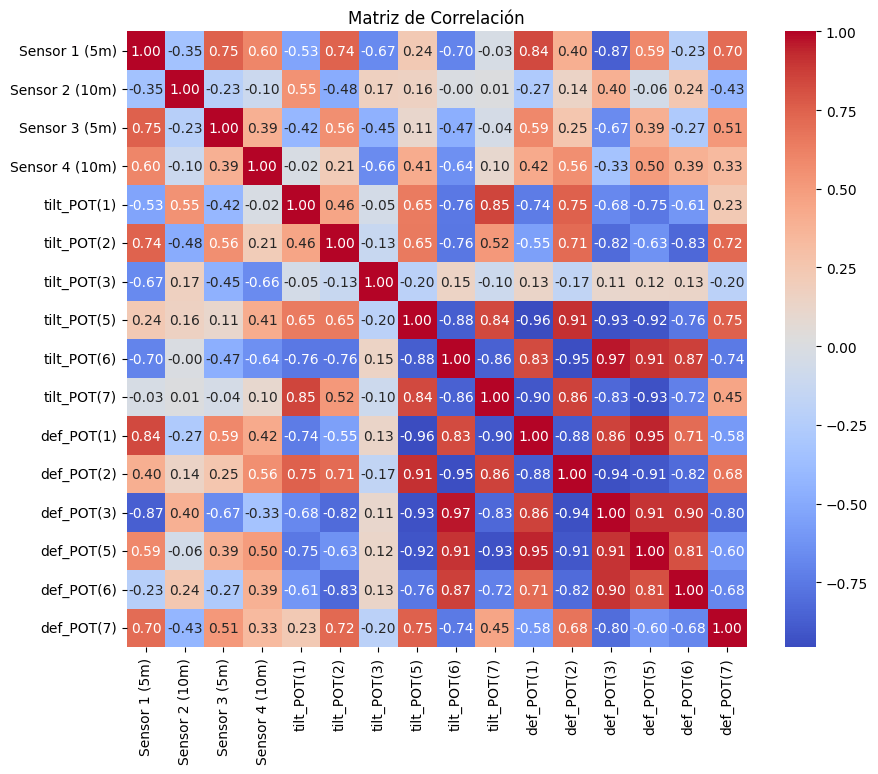

In [ ]:
EPM_TPM_dataset = EPM_spline2.merge(
  TPM_dateset_full,
  on=["date"],
  how="right"
)


EPM_TPM_dataset.to_csv("Dataset.csv")

EPM_TPM_dataset.iloc[:,1:].corr()

plt.figure(figsize=(10, 8))  # Ajusta el tamaño del gráfico si es necesario
sns.heatmap(EPM_TPM_dataset.iloc[:,1:].corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Matriz de Correlación')
plt.show()

Se crea lag

In [ ]:
lag = 5
df_lagged = EPM_TPM_dataset.copy()
for col in list(df_lagged.columns)[1:]:
    for l in range(1, lag + 1):
        df_lagged[f"{col}_lag{l}"] = df_lagged[col].shift(l)

df_lagged_to_val=df_lagged.copy()
#df_lagged_to_val.drop(columns=["date"],inplace=True)
df_lagged.dropna(inplace=True)
df_lagged.drop(columns=["date"],inplace=True)
df_lagged_to_val

,date,Sensor 1 (5m),Sensor 2 (10m),Sensor 3 (5m),Sensor 4 (10m),tilt_POT(1),tilt_POT(2),tilt_POT(3),tilt_POT(5),tilt_POT(6),...,def_POT(6)_lag1,def_POT(6)_lag2,def_POT(6)_lag3,def_POT(6)_lag4,def_POT(6)_lag5,def_POT(7)_lag1,def_POT(7)_lag2,def_POT(7)_lag3,def_POT(7)_lag4,def_POT(7)_lag5
0,2022-11-11 00:00:00,3158.740139,2788.621306,3172.342514,3004.608365,-0.025820,-0.104493,-0.081292,-0.074487,-0.083072,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2022-11-11 00:30:00,3158.713835,2788.505403,3172.339667,3004.607473,-0.025820,-0.104493,-0.081291,-0.074487,-0.083071,...,9.301048,NaN,NaN,NaN,NaN,9.353381,NaN,NaN,NaN,NaN
2,2022-11-11 01:00:00,3158.688700,2788.499200,3172.317200,3004.606200,-0.025820,-0.104492,-0.081291,-0.074487,-0.083071,...,9.300934,9.301048,NaN,NaN,NaN,9.353285,9.353381,NaN,NaN,NaN
3,2022-11-11 01:30:00,3158.664686,2788.613048,3172.273598,3004.604535,-0.025820,-0.104492,-0.081290,-0.074487,-0.083071,...,9.300821,9.300934,9.301048,NaN,NaN,9.353190,9.353285,9.353381,NaN,NaN
4,2022-11-11 02:00:00,3158.642413,2788.833132,3172.212153,3004.602612,-0.025820,-0.104492,-0.081289,-0.074487,-0.083071,...,9.300707,9.300821,9.300934,9.301048,NaN,9.353094,9.353190,9.353285,9.353381,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44593,2025-06-12 22:00:00,NaN,NaN,NaN,NaN,-0.002732,-0.104425,-0.081531,-0.073775,-0.083497,...,9.243611,9.243611,9.243612,9.243613,9.243614,9.546562,9.546564,9.546566,9.546568,9.546570
44594,2025-06-12 22:30:00,NaN,NaN,NaN,NaN,-0.002731,-0.104425,-0.081532,-0.073775,-0.083497,...,9.243610,9.243611,9.243611,9.243612,9.243613,9.546560,9.546562,9.546564,9.546566,9.546568
44595,2025-06-12 23:00:00,NaN,NaN,NaN,NaN,-0.002731,-0.104425,-0.081532,-0.073775,-0.083497,...,9.243609,9.243610,9.243611,9.243611,9.243612,9.546558,9.546560,9.546562,9.546564,9.546566
44596,2025-06-12 23:30:00,NaN,NaN,NaN,NaN,-0.002731,-0.104425,-0.081532,-0.073775,-0.083497,...,9.243608,9.243609,9.243610,9.243611,9.243611,9.546556,9.546558,9.546560,9.546562,9.546564


#Construcción de la red

##Generación de sets de entrenamiento y validación

In [ ]:
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler

train_size = 0.95

target_cols = ['Sensor 1 (5m)', 'Sensor 2 (10m)', 'Sensor 3 (5m)', 'Sensor 4 (10m)']
feature_cols = [c for c in df_lagged.columns if c not in target_cols]

input_dim = len(feature_cols)

print("Features: ",feature_cols)
print("Targets: ",target_cols)

X = df_lagged[feature_cols].values    # aquí entran tilt_POT(1)…(7), def_POT(1)…(7), todos los _lag…
y = df_lagged[target_cols].values     # aquí solo Sensor 1–4 en tiempo t

split = int(len(X)*train_size)
X_train, X_val = X[:split], X[split:]
y_train, y_val = y[:split], y[split:]

# 7) Escalo sin fuga de datos
scaler_X = MinMaxScaler().fit(X_train)
scaler_y = MinMaxScaler().fit(y_train)
X_train = scaler_X.transform(X_train)
X_val   = scaler_X.transform(X_val)
y_train = scaler_y.transform(y_train)
y_val   = scaler_y.transform(y_val)

print("X_train:", X_train.shape, "y_train:", y_train.shape)
print("X_val:  ", X_val.shape,   "y_val:  ", y_val.shape)

Features:  ['tilt_POT(1)', 'tilt_POT(2)', 'tilt_POT(3)', 'tilt_POT(5)', 'tilt_POT(6)', 'tilt_POT(7)', 'def_POT(1)', 'def_POT(2)', 'def_POT(3)', 'def_POT(5)', 'def_POT(6)', 'def_POT(7)', 'Sensor 1 (5m)_lag1', 'Sensor 1 (5m)_lag2', 'Sensor 1 (5m)_lag3', 'Sensor 1 (5m)_lag4', 'Sensor 1 (5m)_lag5', 'Sensor 2 (10m)_lag1', 'Sensor 2 (10m)_lag2', 'Sensor 2 (10m)_lag3', 'Sensor 2 (10m)_lag4', 'Sensor 2 (10m)_lag5', 'Sensor 3 (5m)_lag1', 'Sensor 3 (5m)_lag2', 'Sensor 3 (5m)_lag3', 'Sensor 3 (5m)_lag4', 'Sensor 3 (5m)_lag5', 'Sensor 4 (10m)_lag1', 'Sensor 4 (10m)_lag2', 'Sensor 4 (10m)_lag3', 'Sensor 4 (10m)_lag4', 'Sensor 4 (10m)_lag5', 'tilt_POT(1)_lag1', 'tilt_POT(1)_lag2', 'tilt_POT(1)_lag3', 'tilt_POT(1)_lag4', 'tilt_POT(1)_lag5', 'tilt_POT(2)_lag1', 'tilt_POT(2)_lag2', 'tilt_POT(2)_lag3', 'tilt_POT(2)_lag4', 'tilt_POT(2)_lag5', 'tilt_POT(3)_lag1', 'tilt_POT(3)_lag2', 'tilt_POT(3)_lag3', 'tilt_POT(3)_lag4', 'tilt_POT(3)_lag5', 'tilt_POT(5)_lag1', 'tilt_POT(5)_lag2', 'tilt_POT(5)_lag3', 'til

##Generación del modelo

Esta celda implementa la **Optimización de Hiperparámetros (HPO)** para un modelo **MLP (Perceptrón Multicapa)** utilizando la librería `scikit-optimize`. El objetivo es encontrar la combinación óptima de hiperparámetros como el número de épocas, capas, nodos por capa y la tasa de dropout, que minimice el error cuadrático medio (MSE) de validación. La función `objective_function` construye y entrena el modelo Keras, realizando 5 ensayos por cada combinación de hiperparámetros para una evaluación robusta de su rendimiento

**Definición del modelo**



1.   **Entrada:** La entrada al modelo se compone por: $$\mathbf{d}^{(t)} \;\in\; \mathbb{R}^{6}$$
$$ \sin(\theta)^{t} \in \mathrm{R}^{6*} $$
$$ D^{t-1} \in \mathrm{R}^{4} $$
$$ input = [d^{t},...,d^{t-5},\sin(\theta)^{t},...,\sin(\theta)^{t-5}, D^{t-1},...,D^{t-6}]$$
2.   **Salida:** El modelo genera 1 valor para cada sensor del EPM en el instante $ t $.
$$ output = [D_{1}^{t}, ..., D_{4}^{t}] $$

3.   **Arquitectura del modelo:** Según la exploración de hiperparámetros, la configuración mas ajustada según el espacio de exploración es la siguiente.

$$
\begin{array}{|l|l|}
\hline
\textbf{Hiperparámetro} & \textbf{Valor Óptimo} \\
\hline
\text{Mejor MSE de Validación} & 0.0002 \\
\hline
\text{Epochs} & 10 \\
\hline
\text{Número de Capas} & 2 \\
\hline
\text{Número de Nodos} & 100 \\
\hline
\text{Tasa de Dropout} & 0.0 \\
\hline
\end{array}
$$

$$
\begin{array}{|l|l|}
\hline
\textbf{Diseño de la red}  \\
\hline
\text{Dimensión de entrada} & 92\\
\hline
\text{Capa oculta 1} & \text{100 unidades} \\
\hline
\text{Capa oculta 2} & \text{100 unidades} \\
\hline
\text{Dimensión de salida} & 100 \\
\hline
\end{array}
$$

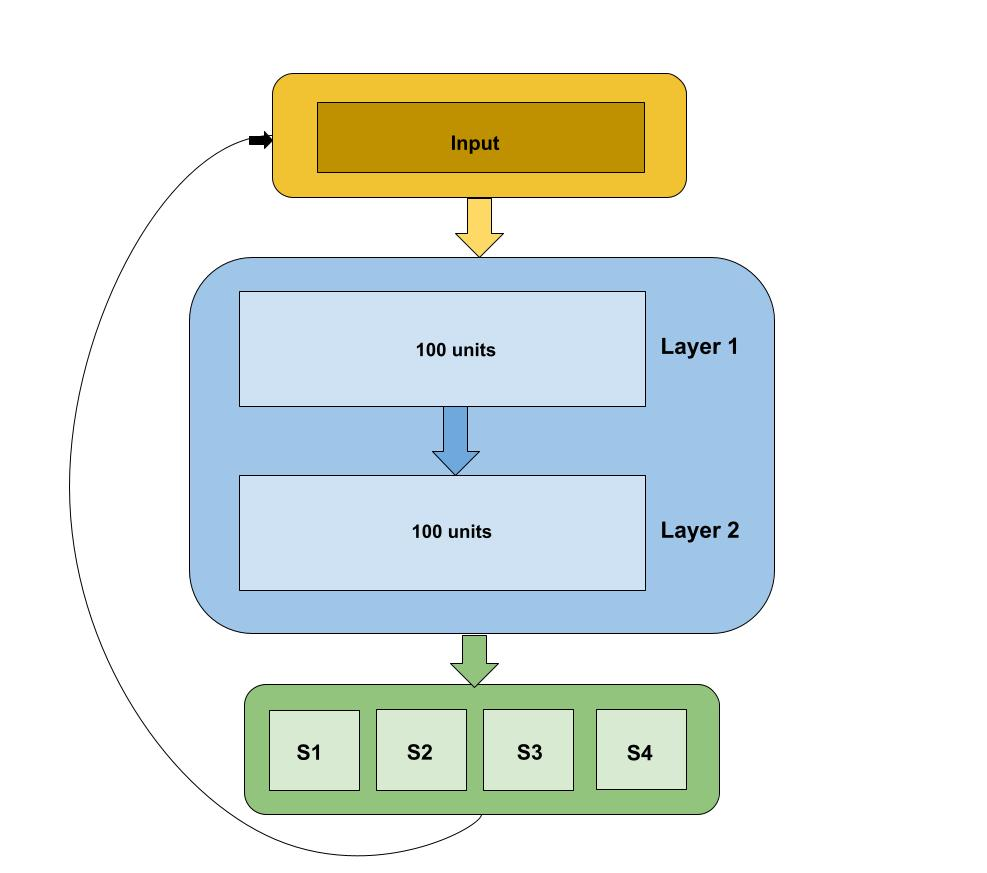

4.   **Métrica utilizada:** $ \text{Error cuadrático medio} (MSE) $

In [ ]:
from skopt import gp_minimize
from skopt.space import Real, Integer, Categorical
from skopt.utils import use_named_args

hyp_space = [
    Integer(10, 100, name='epochs'),
    Integer(1, 6, name='num_layers'),
    Integer(5, 100, name='num_nodes'),
    Real(0.0, 0.5, name='dropout_rate'),
]

@use_named_args(hyp_space)
def objective_function(**params):
    print("init...")
    epochs = params['epochs']
    num_layers = params['num_layers']
    num_nodes = params['num_nodes']
    dropout_rate = params['dropout_rate']
    # lag_value = params['lag_value'] #

    model = tf.keras.Sequential()
    model.add(tf.keras.layers.InputLayer(input_shape=(input_dim,)))

    for _ in range(num_layers):
        model.add(tf.keras.layers.Dense(num_nodes, activation='relu'))
        model.add(tf.keras.layers.Dropout(dropout_rate))

    model.add(tf.keras.layers.Dense(len(target_cols), activation=None)) # output_dim es len(target_cols)

    model.compile(optimizer='adam', loss='mse') # El artículo usa 'adam' y 'mse' [cite: 99, 100]

    num_evaluation_trials = 5
    validation_losses = []

    for trial in range(num_evaluation_trials):
        current_model = tf.keras.Sequential()
        current_model.add(tf.keras.layers.InputLayer(input_shape=(input_dim,)))
        for _ in range(num_layers):
            current_model.add(tf.keras.layers.Dense(num_nodes, activation='relu'))
            current_model.add(tf.keras.layers.Dropout(dropout_rate))
        current_model.add(tf.keras.layers.Dense(len(target_cols), activation=None))
        current_model.compile(optimizer='adam', loss='mse')

        history = current_model.fit(
            X_train, y_train,
            validation_data=(X_val, y_val),
            epochs=epochs,
            batch_size=32,
            verbose=0
        )
        validation_losses.append(history.history['val_loss'][-1])

    # Devolver el promedio del MSE de validación
    avg_validation_loss = np.mean(validation_losses)
    print(f"Probando: BS={32}, E={epochs}, L={num_layers}, N={num_nodes}, DR={dropout_rate}, Loss={avg_validation_loss:.4f}")
    return avg_validation_loss

In [ ]:
print("Iniciando la optimización de hiperparámetros...")
res_gp = gp_minimize(
    objective_function,
    hyp_space,
    n_calls=10,                  # Máximo de arquitecturas a probar [cite: 551]
    n_initial_points=5,         # Número de pruebas iniciales aleatorias [cite: 550]
    random_state=42,             # Para reproducibilidad de la búsqueda
    noise='gaussian',            # Asume ruido en las evaluaciones (útil si evalúas múltiples trials)
    acq_func="EI",               # Expected Improvement (función de adquisición común para GP)
    # base_estimator="GP" si quieres forzar un Proceso Gaussiano explícitamente, pero 'gp_minimize' ya lo hace por defecto.
)

print("\n--- Resultados de HPO ---")
print(f"Mejor MSE de validación encontrado: {res_gp.fun:.4f}")
print("Mejores hiperparámetros encontrados:")
best_params = {param.name: value for param, value in zip(hyp_space, res_gp.x)}
for param_name, param_value in best_params.items():
    print(f"  {param_name}: {param_value}")


Iniciando la optimización de hiperparámetros...
init...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Probando: BS=32, E=82, L=2, N=79, DR=0.29842507897324355, Loss=0.0012
init...
Probando: BS=32, E=50, L=1, N=49, DR=0.16685430556951095, Loss=0.0005
init...
Probando: BS=32, E=23, L=4, N=10, DR=0.3609993861334124, Loss=0.0273
init...
Probando: BS=32, E=94, L=1, N=99, DR=0.3087407548138583, Loss=0.0005
init...
Probando: BS=32, E=65, L=1, N=7, DR=0.26238733012919463, Loss=0.0057
init...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Probando: BS=32, E=96, L=5, N=100, DR=0.037129965782241266, Loss=0.0004
init...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Probando: BS=32, E=22, L=2, N=100, DR=0.0, Loss=0.0002
init...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Probando: BS=32, E=97, L=6, N=100, DR=0.142580836988792, Loss=0.0012
init...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Probando: BS=32, E=13, L=6, N=65, DR=0.17478849173520214, Loss=0.0030
init...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Probando: BS=32, E=100, L=4, N=24, DR=0.10535776691276441, Loss=0.0034

--- Resultados de HPO ---
Mejor MSE de validación encontrado: 0.0002
Mejores hiperparámetros encontrados:
  epochs: 22
  num_layers: 2
  num_nodes: 100
  dropout_rate: 0.0


Mejores parámetros obtenidos por **HPO**

$$
\begin{array}{|l|l|}
\hline
\textbf{Hiperparámetro} & \textbf{Valor Óptimo} \\
\hline
\text{Mejor MSE de Validación} & 0.0002 \\
\hline
\text{Epochs} & 10 \\
\hline
\text{Número de Capas} & 2 \\
\hline
\text{Número de Nodos} & 100 \\
\hline
\text{Tasa de Dropout} & 0.0 \\
\hline
\end{array}
$$

In [ ]:
model = tf.keras.Sequential()
model.add(tf.keras.layers.InputLayer(input_shape=(input_dim,)))
model.add(tf.keras.layers.Dense(100, activation='relu'))
model.add(tf.keras.layers.Dense(100, activation='relu'))
model.add(tf.keras.layers.Dense(len(target_cols), activation=None))
model.compile(optimizer='adam', loss='mse', metrics=['mae','mape'])

# Asegúrate de usar tf.random.set_seed() si quieres reproducibilidad completa para cada trial,
# pero el objetivo aquí es capturar la variabilidad, por lo que quizás no lo uses.

history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=22,         # epochs ahora es un hiperparámetro
    batch_size=32, # batch_size ahora es un hiperparámetro
    verbose=1              # No mostrar el progreso del entrenamiento para no saturar la consola
)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning:

Argument `input_shape` is deprecated. Use `shape` instead.



Epoch 1/22
306/306 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.0305 - mae: 0.0956 - mape: 9681.9053 - val_loss: 0.0012 - val_mae: 0.0274 - val_mape: 7.2283
Epoch 2/22
306/306 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 9.2881e-04 - mae: 0.0225 - mape: 8664.7695 - val_loss: 6.0854e-04 - val_mae: 0.0189 - val_mape: 4.4237
Epoch 3/22
306/306 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 5.9064e-04 - mae: 0.0180 - mape: 5689.4043 - val_loss: 9.9334e-04 - val_mae: 0.0241 - val_mape: 5.8425
Epoch 4/22
306/306 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 4.3319e-04 - mae: 0.0156 - mape: 1984.9701 - val_loss: 4.3384e-04 - val_mae: 0.0165 - val_mape: 3.8183
Epoch 5/22
306/306 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.3672e-04 - mae: 0.0136 - mape: 3809.8403 - val_loss: 3.1468e-04 - val_mae: 0.0146 - val_mape: 3.6894
Epoch 6/22
306/306 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.0066e-04 - mae: 0.0129 - mape: 2400.4272 - val_loss: 2.4900e-04 - val_mae: 0.0129 - val_mape: 3.0971
Epoch 7/22
306/306 ━━━━━━━━━━━

#Resultados

##Parámetros entrenables

In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 100)            │         9,300 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 4)              │           404 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 59,414 (232.09 KB)

 Trainable params: 19,804 (77.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 39,610 (154.73 KB)

##Métricas durante el entrenamiento

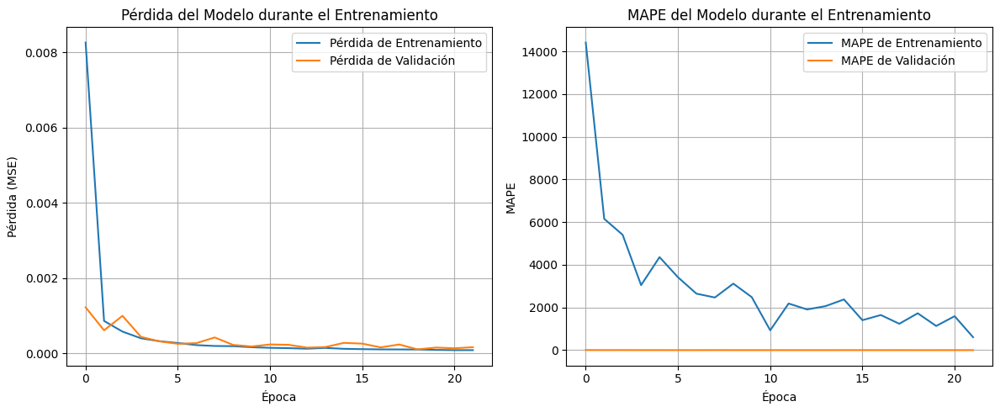

In [ ]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Pérdida de Entrenamiento')
plt.plot(history.history['val_loss'], label='Pérdida de Validación')
plt.title('Pérdida del Modelo durante el Entrenamiento')
plt.xlabel('Época')
plt.ylabel('Pérdida (MSE)')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history.history['mape'], label='MAPE de Entrenamiento')
plt.plot(history.history['val_mape'], label='MAPE de Validación')
plt.title('MAPE del Modelo durante el Entrenamiento')
plt.xlabel('Época')
plt.ylabel('MAPE')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

##Comportamiento en el conjunto de validación

17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


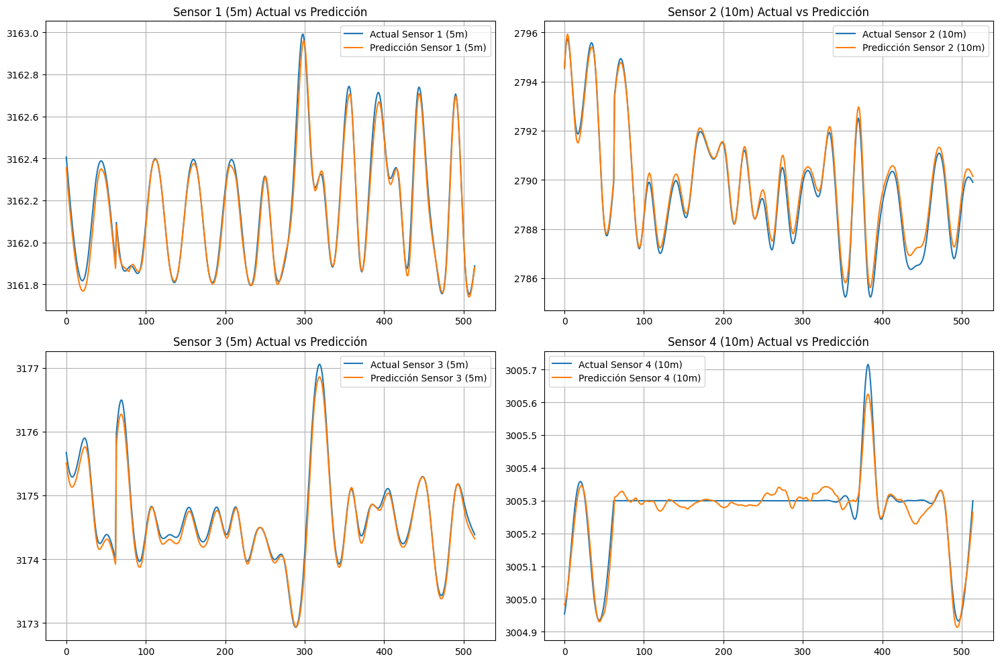

In [ ]:
y_pred_scaled = model.predict(X_val)
y_pred = scaler_y.inverse_transform(y_pred_scaled)
df_y_pred = pd.DataFrame(y_pred,columns=target_cols)

t=df_lagged.iloc[-len(y_pred):,:4]

fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes = axes.flatten()

for i, col in enumerate(target_cols):
    axes[i].plot(df_y_pred.index, t[col], label=f'Actual {col}')
    axes[i].plot(df_y_pred.index, df_y_pred[col], label=f'Predicción {col}')
    axes[i].set_title(f'{col} Actual vs Predicción')
    axes[i].legend()
    axes[i].grid(True)

plt.tight_layout()
plt.show()

In [ ]:
# ——— Parámetros ——————————————————————————————————————
time_col   = 'date'
freq       = '30min'
lag_steps  = 5

sensor_cols = [
    'Sensor 1 (5m)', 'Sensor 2 (10m)',
    'Sensor 3 (5m)', 'Sensor 4 (10m)'
]

# Rango de predicción
start = pd.to_datetime('2023-06-20 01:30:00')
end   = pd.to_datetime('2023-08-20 00:00:00')

df_pred = df_lagged_to_val.copy()

df_pred[time_col] = pd.to_datetime(df_pred[time_col])
df_pred.set_index(time_col, inplace=True)
df_pred.sort_index(inplace=True)

full_idx = pd.date_range(df_pred.index.min(), end, freq=freq)
df_pred = df_pred.reindex(full_idx)

df_pred.loc[start:, sensor_cols] = np.nan

feature_cols = [c for c in df_pred.columns if c not in sensor_cols]

# ——— 3) Bucle autoregresivo —————————————————————————————
for t in df_pred.index[df_pred.index >= start]:
    # extrae el vector crudo de features
    X_raw = df_pred.loc[t, feature_cols].values.reshape(1, -1)

    # escala, predice y desescala
    X_scaled     = scaler_X.transform(X_raw)
    y_scaled_hat = model.predict(X_scaled)
    y_hat        = scaler_y.inverse_transform(y_scaled_hat).ravel()

    # vuelca la predicción en la fila t
    df_pred.loc[t, sensor_cols] = y_hat

    # actualiza las columnas _lag1…_lag5 de sensores en futuras filas
    for lag in range(1, lag_steps+1):
        t_future = t + lag * pd.Timedelta(freq)
        if t_future in df_pred.index:
            for i, col in enumerate(sensor_cols):
                df_pred.at[t_future, f"{col}_lag{lag}"] = y_hat[i]

# ——— 4) Inspecciona un tramo de salida ——————————————————————
print(df_pred.loc[start:start + pd.Timedelta('2H'), sensor_cols])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms

/tmp/ipython-input-21-1942980335.py:49: FutureWarning:

'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.



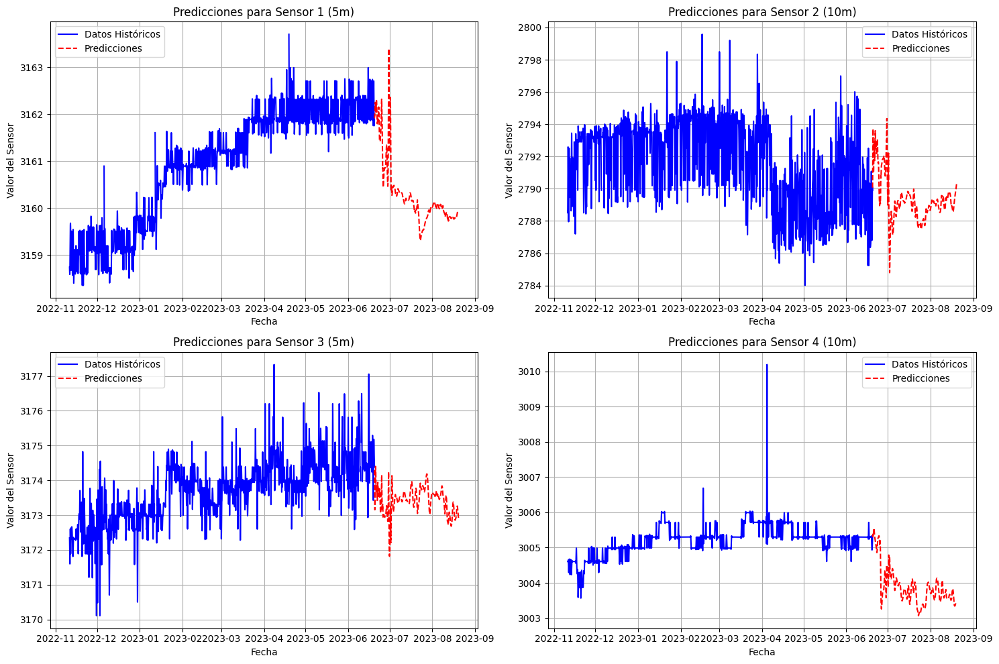

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes = axes.flatten()

for i, col in enumerate(sensor_cols):
    ax = axes[i]
    ax.plot(df_pred.index[df_pred.index < start],
            df_pred.loc[df_pred.index < start, col],
            label='Datos Históricos', color='blue')
    ax.plot(df_pred.index[df_pred.index >= start],
            df_pred.loc[df_pred.index >= start, col],
            label='Predicciones', color='red', linestyle='--')

    ax.set_title(f'Predicciones para {col}')
    ax.set_xlabel('Fecha')
    ax.set_ylabel('Valor del Sensor')
    ax.legend()
    ax.grid(True)

plt.tight_layout()
plt.show()

#Conclusiones

1. Para poder explorar un espacio de hiperparámetros grandes, es necesario contar con un bueno ambiente de pruebas que garantice la minimización de tiempos de ejecución, sin embargo, estás técnicas permiten una exploración automática e "inteligente" en el espacio de hiperparámetros.
2. Puede ser común pensar que para este tipo de tareas de predicción con gran cantidad de entradas es necesario construir modelos grandes y voluminosos, en este caso se observó que con dos capas con 100 unidades, por ahora resultó ser la mejor combinación para este problema
3.   Los modelos autoregresivos suelen acumular errores en horizontes de predicción largos, haciendo que la red diverja. En este caso se observa que para horizontes largos (meses) los datos se mantienen en los ordenes de magnitud de los datos históricos conocidos. La alternativa de una instrumentación auxiliar con datos conocidos promete un resultado por lo menos estable y definido por las tendencias de los datos.
4.   Al incluir $batch size$ y $lag$ dentro del espacio de hiperparámetros se encontró que estos dos parámetros aumentaron enormemente los tiempo de ejecución del proceso, por eso, fueron excluidos de la experimentación, pero para trabajo futuro de deberían considerar como parámetros explorables.
5. Explorar otras campas con unidades LST/GRU a metodologías en el espacio de hiperparámetros puede que permita encontrar arquitecturas más robustas y capaces que abstraer relaciones más profundas entre las variables exógenas y las variables objetivo.

#Bibliografia

[1] Park, J., Müller, J., Arora, B., Faybishenko, B., Pastorello, G., Varadharajan, C., Sahu, R. & Agarwal, D. (2022). Long-Term Missing Value Imputation for Time Series Data Using Deep Neural Networks (arXiv:2202.12441v1) [Preprint]. arXiv. https://doi.org/10.48550/arXiv.2202.12441